In [1]:
import numpy as np
import time
import matplotlib.pyplot as plt
from xnes import XNES

from scipy.ndimage.filters import gaussian_filter1d
import cma

/var/folders/sy/n2t2cdd16kb_hwrkbkw7b0dw0000gn/T/ipykernel_3930/3356309095.py:6: DeprecationWarning: Please import `gaussian_filter1d` from the `scipy.ndimage` namespace; the `scipy.ndimage.filters` namespace is deprecated and will be removed in SciPy 2.0.0.
  from scipy.ndimage.filters import gaussian_filter1d


In [2]:
## smooth the plot
def smooth(scalars , weight=0.4):  # Weight between 0 and 1
    last = scalars[0]  # First value in the plot (first timestep)
    smoothed = list()
    for point in scalars:
        smoothed_val = last * weight + (1 - weight) * point  
        smoothed.append(smoothed_val)                        
        last = smoothed_val                                 
        
    return smoothed

## black box optimization functions

In [3]:
def rosenbrock_function(x):
    return np.sum(100.0 * (x[1:] - x[:-1]**2)**2 + (1 - x[:-1])**2)

def ackley_function(x):
 
    n = len(x)
    sum1 = np.sum(x**2)
    sum2 = np.sum(np.cos(2*np.pi*x))
    return -20 * np.exp(-0.2 * np.sqrt(sum1 / n)) - np.exp(sum2 / n) + 20 + np.exp(1)

def sphere_function(x):
    return np.sum(x**2)

## ES & NES

In [4]:


def es(objective_function, mu, A, population_size, learning_rate_mu, learning_rate_A, num_generations, utilities, decay_rate=0.9, epsilon=1e-10, regularization_strength=0, beta_mu=0.8, beta_A=0.8, natural_grad=False):
    n_features = mu.shape[0]
    eval_hist_es = []

    # Initialize momentum terms for mu and A
    v_mu = np.zeros_like(mu)
    v_A = np.zeros_like(A)
    

    for gen in range(num_generations):
        F_mu = np.zeros((n_features, n_features))
        F_A = np.zeros_like(A)
        
        z = np.random.normal(0, 1, (population_size, n_features))
        x = mu + np.dot(A, z.T).T  

        fitness = np.array([objective_function(xi) for xi in x])
        eval_hist_es += list(fitness)

        indices = np.argsort(fitness)

        AAT_inv = np.linalg.inv(np.dot(A, A.T))
        grad_mu = np.mean([utilities[i] * np.dot(AAT_inv, (x[indices[i]] - mu)) for i in range(population_size)], axis=0)

        grad_A = np.zeros_like(A)

        for idx in range(population_size):
            xi = x[indices[idx]]
            diff = xi - mu
            outer_diff = np.outer(diff, diff)
            R = np.dot(np.linalg.inv(A).T, np.dot(outer_diff, AAT_inv))

            for i in range(n_features):
                for j in range(i, n_features):
                    correction = 1 / A[i, i] if i == j else 0
                    grad_A[i, j] = utilities[indices[idx]] * (R[i, j] - correction)

        grad_A /= population_size
        
      
        for idx in range(n_features):
            for jdx in range(idx, n_features):
                F_A[idx, jdx] = grad_A[idx, jdx]
                
        F_mu += np.outer(grad_mu, grad_mu)     

      
        grad_mu -= regularization_strength * mu
        grad_A -= regularization_strength * A

      
        if natural_grad:
            v_mu = beta_mu * v_mu + learning_rate_mu * np.linalg.solve(F_mu + epsilon * np.eye(n_features), grad_mu)
            v_A = beta_A * v_A + learning_rate_A * np.linalg.solve(F_A + epsilon * np.eye(n_features), grad_A)
        else:
            v_mu = beta_mu * v_mu + learning_rate_mu *  grad_mu  #prev_update * beta - lr * grad
            v_A = beta_A * v_A + learning_rate_A *  grad_A

        # Update parameters with momentum, v_mu records prev update
        mu += v_mu
        A += v_A

      
        learning_rate_mu *= decay_rate
        learning_rate_A *= decay_rate

    return mu, A, eval_hist_es




## CMAES

In [5]:
class my_CMAES:
    def __init__(self, objective_function, num_params,init_mu, population_size=50, learning_rate=0.1,c_sigma=0.3, evo_path=False, rank_u=False):
        self.objective_function = objective_function
        self.num_params = num_params
        self.population_size = population_size
        self.learning_rate = learning_rate
       
        self.c_sigma = c_sigma
        self.eval_hist=[]
        self.path = np.zeros(num_params) 
        self.evo_path=evo_path
        self.rank_u = rank_u
        self.init_mu = init_mu

    def optimize(self, num_iterations):
        # Initialize parameters
        mean_params = self.init_mu
        
        covariance_matrix = np.eye(len(mean_params))
      
        for i in range(num_iterations):
            
            population = np.random.multivariate_normal(mean_params, covariance_matrix, self.population_size)

            # Evaluate 
            fitness = np.array([self.objective_function(params) for params in population])
            self.eval_hist += list(fitness)

         
            sorted_indices = np.argsort(fitness)
            sorted_population = population[sorted_indices]

         
            selected_population = sorted_population[:self.population_size // 2]
            mean_gradient = np.mean(selected_population - mean_params, axis=0)
            mean_params += self.learning_rate * mean_gradient
            
            self.path = (1 - self.c_sigma) * self.path + np.sqrt(self.c_sigma * (2 - self.c_sigma)) * mean_gradient

          
            update_matrix = np.dot((selected_population - mean_params).T, selected_population - mean_params) / (self.population_size // 2 - 1)
            
            if self.rank_u and not self.evo_path:
                covariance_matrix = (1 - self.learning_rate) * covariance_matrix
                covariance_matrix+= self.learning_rate *update_matrix
                
            if self.evo_path and not  self.rank_u:
                covariance_matrix = (1 - self.learning_rate) * covariance_matrix
                covariance_matrix += self.learning_rate  * 1.5*np.outer(self.path, self.path)
                
            if self.evo_path and  self.rank_u:
                covariance_matrix = (1 -self.learning_rate) * covariance_matrix
                covariance_matrix+= self.learning_rate * update_matrix
                covariance_matrix += self.learning_rate * 1.5*np.outer(self.path, self.path)
            
           
            print("Iteration {}: Best Fitness: {}".format(i+1, fitness[sorted_indices[0]]))
        return mean_params


## experiments

### ackley

[4.97885383 4.9850972 ]
[ 1.95800265 20.03820596]
[ 0.02236777 -0.01906391] 0.06476175384447168 [[0.99222859 0.04683048]
 [0.0462894  1.01001701]]
[ 4.25757904e-04 -4.85450331e-06] 0.0022915172411440555 [[1.00160963 0.05054373]
 [0.05179772 1.0010068 ]]
[-2.18565801e-05  1.52706373e-05] 0.00010731228351665494 [[1.00644537 0.03798888]
 [0.03955337 0.99508887]]
[1.31580721e-06 1.77208277e-06] 3.909338363214287e-06 [[1.02461072 0.01590884]
 [0.01919149 0.9762784 ]]
[ 3.83864285e-09 -1.21601571e-08] 1.6899137848453662e-07 [[1.0064141  0.03675392]
 [0.0385132  0.99503326]]
[-3.06694645e-09  2.35915163e-09] 5.478701527646889e-09 [[0.98302908 0.03155512]
 [0.03204557 1.01829256]]
[-6.65534871e-11 -8.79895801e-11] 2.361336302091507e-10 [[0.98332415 0.03777683]
 [0.03890792 1.01845339]]
[ 2.39303298e-12 -3.05515366e-12] 9.118744656480195e-12 [[0.99121761 0.04054449]
 [0.04220656 1.01058661]]
[ 1.89922666e-13 -3.35262068e-13] 3.8005646493742856e-13 [[1.00026518 0.02428584]
 [0.02624976 1.0003722

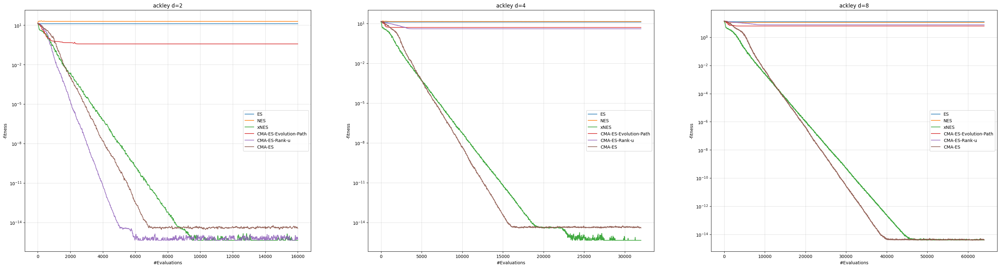

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

In [6]:
fig, axs = plt.subplots(1,3 ,figsize=(40, 10))
for idx, d in enumerate([2,4,8]):
    plt.figure()
    initial_mu = np.ones(d) * 5
    initial_A = np.linalg.cholesky(np.eye(d)) / (20)

    population_size = 4*d
    learning_rate_mu = 0.2
    learning_rate_A = 0.001
    num_generations = 2000
    utilities = np.ones(population_size) / population_size/2
    utilities[population_size // 2:] = 0
    #utilities = np.linspace(1, 0, population_size)

    mu_final, A_final, eval_hist_es = es(ackley_function, initial_mu, initial_A, population_size, learning_rate_mu, learning_rate_A, num_generations, utilities,natural_grad=False)
    print(mu_final)

    initial_mu = np.ones(d) * 5
    mu_final, A_final, eval_hist_nes = es(ackley_function, initial_mu, initial_A, population_size, learning_rate_mu, learning_rate_A, num_generations, utilities,natural_grad=True)
    print(mu_final)

    initial_mu = np.ones(d) * 5
    mu =initial_mu
    amat = np.eye(len(mu))

    def f(x):
        return -ackley_function(x)

    #xnes = XNES(f, mu, amat, use_adasam=False, patience=99999, eta_bmat=0.00001, eta_sigma=.00001)
    xnes = XNES(f, mu, amat, use_adasam=False, patience=99999, eta_bmat=0.01, eta_sigma=.1,npop=4*d)
    t0 = time.time()

    for i in range(50):
        xnes.step(100)  # 100 * 20
        
    initial_mu = np.ones(d) * 5
    my_cmaes_evo = my_CMAES(objective_function=ackley_function, num_params=d, init_mu= initial_mu, population_size=4*d, learning_rate=0.2,evo_path=True, rank_u=False)
    optimal_params = my_cmaes_evo.optimize(num_iterations=6000)
    initial_mu = np.ones(d) * 5
    my_cmaes_ranku = my_CMAES(objective_function=ackley_function, num_params=d, init_mu= initial_mu, population_size=4*d, learning_rate=0.2,evo_path=False, rank_u=True)
    optimal_params = my_cmaes_ranku.optimize(num_iterations=6000)
    initial_mu = np.ones(d) * 5
    my_cmaes_ranku_evo = my_CMAES(objective_function=ackley_function, num_params=d, init_mu= initial_mu, population_size=4*d, learning_rate=0.2,evo_path=True, rank_u=True)
    optimal_params = my_cmaes_ranku_evo.optimize(num_iterations=6000)
    l =[ len(xnes.eval_hist),len(eval_hist_es),len(eval_hist_nes ), len(my_cmaes_evo.eval_hist), len(my_cmaes_ranku.eval_hist), len(my_cmaes_ranku_evo.eval_hist)]
    print(l)
    iter=min(l)


    axs[idx].plot( gaussian_filter1d(eval_hist_es[:iter],sigma=8) , label ='ES',alpha=0.9)

    axs[idx].plot( gaussian_filter1d(eval_hist_nes[:iter],sigma=8) , label ='NES',alpha=0.9)
    axs[idx].plot( gaussian_filter1d([-x for x in  xnes.eval_hist][:iter] ,sigma=8) , label ='xNES',alpha=0.9)

    axs[idx].plot( gaussian_filter1d(my_cmaes_evo.eval_hist[:iter] ,sigma=8), label ='CMA-ES-Evolution-Path',alpha=0.9)

    axs[idx].plot( gaussian_filter1d(my_cmaes_ranku.eval_hist[:iter] ,sigma=8), label ='CMA-ES-Rank-u',alpha=0.9)

    axs[idx].plot( gaussian_filter1d(my_cmaes_ranku_evo.eval_hist[:iter] ,sigma=8), label ='CMA-ES',alpha=0.9)

    #plt.plot( gaussian_filter1d(eval_hist[:iter] ,sigma=8), label ='CMA-ES-package',alpha=0.8)

    axs[idx].set_yscale('log')
    axs[idx].set_xlabel('#Evaluations')
    axs[idx].set_ylabel('-fitness')
    axs[idx].legend(loc='center right')
    axs[idx].grid(alpha=0.4)
    axs[idx].set_title('ackley d=' + str(d))

#fig.savefig('ackley.jpg',  bbox_inches='tight', dpi=200)
plt.show()

### rosenbrock

[3.17689122 5.34710124]
[ 4.39085039 20.17497887]
[0.74681358 0.57865694] 0.11186744244204636 [[0.97747383 0.15547788]
 [0.15635746 1.04791565]]
[0.99368993 0.98290788] 0.009676857512018001 [[0.901502   0.33618232]
 [0.30820112 1.22419226]]
[1.00007969 0.99970827] 0.0008611156091461697 [[0.84469415 0.52715506]
 [0.45823741 1.46983635]]
[0.99995883 0.99990641] 7.983261503338909e-05 [[0.83466218 0.73253728]
 [0.63159641 1.75240709]]
[1.0000019  1.00000451] 7.389267372290852e-06 [[0.87695395 0.95360492]
 [0.85219383 2.06699134]]
[0.99999981 0.99999948] 5.139313791906796e-07 [[0.91149892 1.15815075]
 [1.01793065 2.39047693]]
[1. 1.] 2.8432398168575998e-08 [[0.98212537 1.38000065]
 [1.22884345 2.74486827]]
[1. 1.] 1.2870323468058052e-09 [[1.04418078 1.5820149 ]
 [1.40067331 3.07981732]]
[1. 1.] 4.721652217105575e-11 [[1.11676011 1.7278962 ]
 [1.56661596 3.31937874]]
[1. 1.] 1.9516302353879914e-12 [[1.17207541 1.89056837]
 [1.70041237 3.59596814]]
[1. 1.] 7.332108158066114e-14 [[1.20506597 2

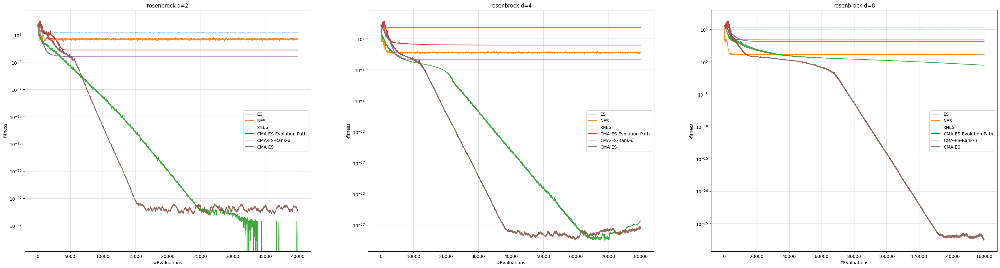

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

In [8]:
fig, axs = plt.subplots(1,3,figsize=(40, 10))

for idx, d in enumerate([2,4,8]):
    plt.figure()
    initial_mu = np.ones(d) * 5
    initial_A = np.linalg.cholesky(np.eye(d)) / (20)

    population_size = 10*d
    learning_rate_mu = 0.2
    learning_rate_A = 0.001
    num_generations = 2000
    utilities = np.ones(population_size) / population_size/2
    utilities[population_size // 2:] = 0
    #utilities = np.linspace(1, 0, population_size)

    mu_final, A_final, eval_hist_es = es(rosenbrock_function, initial_mu, initial_A, population_size, learning_rate_mu, learning_rate_A, num_generations, utilities,natural_grad=False)
    print(mu_final)

    initial_mu = np.ones(d) * 5
    mu_final, A_final, eval_hist_nes = es(rosenbrock_function, initial_mu, initial_A, population_size, learning_rate_mu, learning_rate_A, num_generations, utilities,natural_grad=True)
    print(mu_final)

    initial_mu = np.ones(d) * 5
    mu =initial_mu
    amat = np.eye(len(mu))

    def f(x):
        return -rosenbrock_function(x)

    #xnes = XNES(f, mu, amat, use_adasam=False, patience=99999, eta_bmat=0.00001, eta_sigma=.00001)
    
    xnes = XNES(f, mu, amat, use_adasam=False, patience=99999,  eta_bmat=0.01, eta_sigma=.1,npop=10*d)
   
    if d>=8:
        xnes = XNES(f, mu, amat, use_adasam=False, patience=99999,  eta_bmat=0.01, eta_sigma=.1,npop=40*d)
        
    t0 = time.time()

    for i in range(50):
        xnes.step(100)  # 100 * 20
        
    initial_mu = np.ones(d) * 5
    my_cmaes_evo = my_CMAES(objective_function=rosenbrock_function, num_params=d, init_mu= initial_mu, population_size=10*d, learning_rate=0.1,evo_path=True, rank_u=False)
    optimal_params = my_cmaes_evo.optimize(num_iterations=6000)
    initial_mu = np.ones(d) * 5
    if d==8:
        my_cmaes_ranku = my_CMAES(objective_function=rosenbrock_function, num_params=d, init_mu= initial_mu, population_size=10*d, learning_rate=0.2,evo_path=False, rank_u=True)
    else:  
        my_cmaes_ranku = my_CMAES(objective_function=rosenbrock_function, num_params=d, init_mu= initial_mu, population_size=10*d, learning_rate=0.2,evo_path=False, rank_u=True)
    optimal_params = my_cmaes_ranku.optimize(num_iterations=6000)
    initial_mu = np.ones(d) * 5
    my_cmaes_ranku_evo = my_CMAES(objective_function=rosenbrock_function, num_params=d, init_mu= initial_mu, population_size=10*d, learning_rate=0.2,evo_path=True, rank_u=True)
    optimal_params = my_cmaes_ranku_evo.optimize(num_iterations=6000)
    l =[ len(xnes.eval_hist),len(eval_hist_es),len(eval_hist_nes ), len(my_cmaes_evo.eval_hist), len(my_cmaes_ranku.eval_hist), len(my_cmaes_ranku_evo.eval_hist)]
    
    print(l)
    iter=min(l)


    axs[idx].plot( gaussian_filter1d(eval_hist_es[:iter],sigma=8) , label ='ES',alpha=0.9)

    axs[idx].plot( gaussian_filter1d(eval_hist_nes[:iter],sigma=8) , label ='NES',alpha=0.9)
    axs[idx].plot( gaussian_filter1d([-x for x in  xnes.eval_hist][:iter] ,sigma=8) , label ='xNES',alpha=0.9)

    axs[idx].plot( gaussian_filter1d(my_cmaes_evo.eval_hist[:iter] ,sigma=8), label ='CMA-ES-Evolution-Path',alpha=0.9)

    axs[idx].plot( gaussian_filter1d(my_cmaes_ranku.eval_hist[:iter] ,sigma=8), label ='CMA-ES-Rank-u',alpha=0.9)

    axs[idx].plot( gaussian_filter1d(my_cmaes_ranku_evo.eval_hist[:iter] ,sigma=8), label ='CMA-ES',alpha=0.9)

    #plt.plot( gaussian_filter1d(eval_hist[:iter] ,sigma=8), label ='CMA-ES-package',alpha=0.8)

    axs[idx].set_yscale('log')
    axs[idx].set_xlabel('#Evaluations')
    axs[idx].set_ylabel('-fitness')
    axs[idx].legend(loc='center right')
    axs[idx].grid(alpha=0.4)
    axs[idx].set_title('rosenbrock d=' + str(d))

fig.savefig('rosenbrock.jpg',  bbox_inches='tight', dpi=200)
plt.show()

### sphere

[1.67186074 1.41109326]
[-26.13923792 -19.46595887]
[0.01995724 0.01852158] 0.05328138812635518 [[ 0.98894465 -0.02116175]
 [-0.02046241  1.0116168 ]]
[ 0.00023943 -0.00031947] 0.0022674154568973585 [[ 1.01355761 -0.02402519]
 [-0.02449493  0.98720436]]
[-2.88157918e-05  1.66751762e-06] 6.895480894276879e-05 [[ 0.994425   -0.00819341]
 [-0.00825337  1.00567426]]
[ 1.04696762e-06 -4.57687312e-07] 2.3889567685015365e-06 [[ 0.99735664 -0.02533133]
 [-0.02553428  1.0032989 ]]
[ 3.44433470e-10 -5.34671217e-08] 9.655659829219818e-08 [[ 0.96444899 -0.04270987]
 [-0.04242982  1.03874045]]
[1.55213621e-09 1.16350681e-09] 3.546176359362032e-09 [[ 0.99241376 -0.06258855]
 [-0.06554442  1.01177793]]
[ 1.43009577e-11 -6.26890531e-12] 1.8108575906046936e-10 [[ 1.00361155 -0.03823432]
 [-0.04242263  0.99801761]]
[-3.92965493e-13 -8.59754154e-13] 8.407836950940474e-12 [[ 1.01011331 -0.02548771]
 [-0.0307154   0.99076297]]
[2.12246396e-14 7.59820484e-14] 3.9533223203710917e-13 [[ 1.00296181 -0.04315973

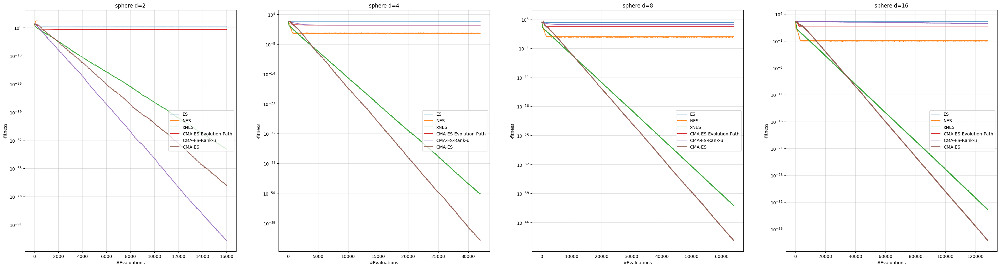

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

In [7]:
fig, axs = plt.subplots(1,4,figsize=(40, 10))

for idx, d in enumerate([2,4,8,16]):
    plt.figure()
    initial_mu = np.ones(d) * 5
    initial_A = np.linalg.cholesky(np.eye(d)) / (20)

    population_size = 4*d
    learning_rate_mu = 0.2
    learning_rate_A = 0.001
    num_generations = 2000
    utilities = np.ones(population_size) / population_size/2
    utilities[population_size // 2:] = 0
    #utilities = np.linspace(1, 0, population_size)

    mu_final, A_final, eval_hist_es = es(sphere_function, initial_mu, initial_A, population_size, learning_rate_mu, learning_rate_A, num_generations, utilities,natural_grad=False)
    print(mu_final)

    initial_mu = np.ones(d) * 5
    mu_final, A_final, eval_hist_nes = es(sphere_function, initial_mu, initial_A, population_size, learning_rate_mu, learning_rate_A, num_generations, utilities,natural_grad=True)
    print(mu_final)

    initial_mu = np.ones(d) * 5
    mu =initial_mu
    amat = np.eye(len(mu))

    def f(x):
        return -sphere_function(x)


    
    xnes = XNES(f, mu, amat, use_adasam=False, patience=99999,  eta_bmat=0.01, eta_sigma=.1,npop=4*d)
   
    #if d>=8:
        #xnes = XNES(f, mu, amat, use_adasam=False, patience=99999,  eta_bmat=0.001, eta_sigma=.01,npop=10*d)
        
    t0 = time.time()

    for i in range(50):
        xnes.step(100)  # 100 * 20
        
    initial_mu = np.ones(d) * 5
    my_cmaes_evo = my_CMAES(objective_function=sphere_function, num_params=d, init_mu= initial_mu, population_size=4*d, learning_rate=0.2,evo_path=True, rank_u=False)
    optimal_params = my_cmaes_evo.optimize(num_iterations=6000)
    initial_mu = np.ones(d) * 5
    if d>=16:
        my_cmaes_ranku = my_CMAES(objective_function=sphere_function, num_params=d, init_mu= initial_mu, population_size=8*d, learning_rate=0.01,evo_path=False, rank_u=True)
    else:  
        my_cmaes_ranku = my_CMAES(objective_function=sphere_function, num_params=d, init_mu= initial_mu, population_size=4*d, learning_rate=0.2,evo_path=False, rank_u=True)
        
    optimal_params = my_cmaes_ranku.optimize(num_iterations=6000)
    initial_mu = np.ones(d) * 5
    my_cmaes_ranku_evo = my_CMAES(objective_function=sphere_function, num_params=d, init_mu= initial_mu, population_size=4*d, learning_rate=0.2,evo_path=True, rank_u=True)
    optimal_params = my_cmaes_ranku_evo.optimize(num_iterations=6000)
    l =[ len(xnes.eval_hist),len(eval_hist_es),len(eval_hist_nes ), len(my_cmaes_evo.eval_hist), len(my_cmaes_ranku.eval_hist), len(my_cmaes_ranku_evo.eval_hist)]
    
    print(l)
    iter=min(l)


    axs[idx].plot( gaussian_filter1d(eval_hist_es[:iter],sigma=8) , label ='ES',alpha=0.9)

    axs[idx].plot( gaussian_filter1d(eval_hist_nes[:iter],sigma=8) , label ='NES',alpha=0.9)
    axs[idx].plot( gaussian_filter1d([-x for x in  xnes.eval_hist][:iter] ,sigma=8) , label ='xNES',alpha=0.9)

    axs[idx].plot( gaussian_filter1d(my_cmaes_evo.eval_hist[:iter] ,sigma=8), label ='CMA-ES-Evolution-Path',alpha=0.9)

    axs[idx].plot( gaussian_filter1d(my_cmaes_ranku.eval_hist[:iter] ,sigma=8), label ='CMA-ES-Rank-u',alpha=0.9)

    axs[idx].plot( gaussian_filter1d(my_cmaes_ranku_evo.eval_hist[:iter] ,sigma=8), label ='CMA-ES',alpha=0.9)

    #plt.plot( gaussian_filter1d(eval_hist[:iter] ,sigma=8), label ='CMA-ES-package',alpha=0.8)

    axs[idx].set_yscale('log')
    axs[idx].set_xlabel('#Evaluations')
    axs[idx].set_ylabel('-fitness')
    axs[idx].legend(loc='center right')
    axs[idx].grid(alpha=0.4)
    axs[idx].set_title('sphere d=' + str(d))

fig.savefig('sphere.jpg',  bbox_inches='tight', dpi=200)
plt.show()

### Optuna

In [ ]:
import torch
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim
from torchvision import datasets, transforms
from cmaes import CMA
import optuna

class SimpleNN(nn.Module):
    def __init__(self, input_size, hidden_size, output_size):
        super(SimpleNN, self).__init__()
        self.fc1 = nn.Linear(input_size, hidden_size)
        self.fc2 = nn.Linear(hidden_size, output_size)

    def forward(self, x):
        x = F.relu(self.fc1(x))
        x = self.fc2(x)
        return x

/Users/baojiaqi/Downloads/notebooks_export/.venv/lib/python3.11/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [11]:
def objective(trial):
    # Load data
    train_loader = torch.utils.data.DataLoader(
        datasets.MNIST('../data', train=True, download=True,
                       transform=transforms.Compose([
                           transforms.ToTensor(),
                           transforms.Normalize((0.5,), (0.5,))
                       ])),
        batch_size=100, shuffle=True)
    
    test_loader = torch.utils.data.DataLoader(
        datasets.MNIST('../data', train=False, transform=transforms.Compose([
                           transforms.ToTensor(),
                           transforms.Normalize((0.5,), (0.5,))
                       ])),
        batch_size=100, shuffle=True)
    
    # Suggest hyperparameters
    hidden_size = trial.suggest_int('hidden_size', 50, 500)
    lr = trial.suggest_loguniform('lr', 1e-5, 1e-1)
    
    model = SimpleNN(28*28, hidden_size, 10)
    optimizer = optim.Adam(model.parameters(), lr=lr)
    criterion = nn.CrossEntropyLoss()
    
    # Training
    for epoch in range(2):  #
        model.train()
        for batch_idx, (data, target) in enumerate(train_loader):
            data, target = data.view(-1, 28*28), target
            optimizer.zero_grad()
            output = model(data)
            loss = criterion(output, target)
            loss.backward()
            optimizer.step()
            
    # Validation
    model.eval()
    correct = 0
    with torch.no_grad():
        for data, target in test_loader:
            data, target = data.view(-1, 28*28), target
            output = model(data)
            pred = output.argmax(dim=1, keepdim=True)
            correct += pred.eq(target.view_as(pred)).sum().item()

    accuracy = correct / len(test_loader.dataset)
    return accuracy


In [12]:

def run_optimization(sampler, n_trials=5):
    study = optuna.create_study(direction='maximize', sampler=sampler)
    study.optimize(objective, n_trials=n_trials)
    return study

# Optimize with different samplers for Grid Sampler
param_grid = {
    'hidden_size': [50, 100, 200],  # Example values
    'lr': [1e-5, 1e-3, 1e-1]        # Example values
}

grid_study = run_optimization(optuna.samplers.RandomSampler())
cmaes_study = run_optimization(optuna.samplers.CmaEsSampler())
tpe_study = run_optimization(optuna.samplers.TPESampler())


[I 2024-04-05 20:11:04,035] A new study created in memory with name: no-name-721244a8-1a26-4ef8-9c57-9555293e48e7


100%|██████████| 9912422/9912422 [00:00<00:00, 12283066.51it/s]


Extracting ../data/MNIST/raw/train-images-idx3-ubyte.gz to ../data/MNIST/raw



100%|██████████| 28881/28881 [00:00<00:00, 7424349.95it/s]


Extracting ../data/MNIST/raw/train-labels-idx1-ubyte.gz to ../data/MNIST/raw



100%|██████████| 1648877/1648877 [00:00<00:00, 16232010.13it/s]


Extracting ../data/MNIST/raw/t10k-images-idx3-ubyte.gz to ../data/MNIST/raw



100%|██████████| 4542/4542 [00:00<00:00, 16696344.23it/s]
/var/folders/sy/n2t2cdd16kb_hwrkbkw7b0dw0000gn/T/ipykernel_98807/584464511.py:20: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  lr = trial.suggest_loguniform('lr', 1e-5, 1e-1)


Extracting ../data/MNIST/raw/t10k-labels-idx1-ubyte.gz to ../data/MNIST/raw



[I 2024-04-05 20:11:12,526] Trial 0 finished with value: 0.8954 and parameters: {'hidden_size': 422, 'lr': 3.0180498091361615e-05}. Best is trial 0 with value: 0.8954.
[I 2024-04-05 20:11:17,964] Trial 1 finished with value: 0.9476 and parameters: {'hidden_size': 237, 'lr': 0.0005656092176488796}. Best is trial 1 with value: 0.9476.
[I 2024-04-05 20:11:23,152] Trial 2 finished with value: 0.9288 and parameters: {'hidden_size': 124, 'lr': 0.0003959823807300312}. Best is trial 1 with value: 0.9476.
[I 2024-04-05 20:11:28,928] Trial 3 finished with value: 0.7827 and parameters: {'hidden_size': 415, 'lr': 0.035476746429176455}. Best is trial 1 with value: 0.9476.
[I 2024-04-05 20:11:35,070] Trial 4 finished with value: 0.9099 and parameters: {'hidden_size': 333, 'lr': 5.473142943854347e-05}. Best is trial 1 with value: 0.9476.
[I 2024-04-05 20:11:35,071] A new study created in memory with name: no-name-49834243-60fd-428f-b181-51b5427dd21e
[I 2024-04-05 20:11:40,500] Trial 0 finished with v

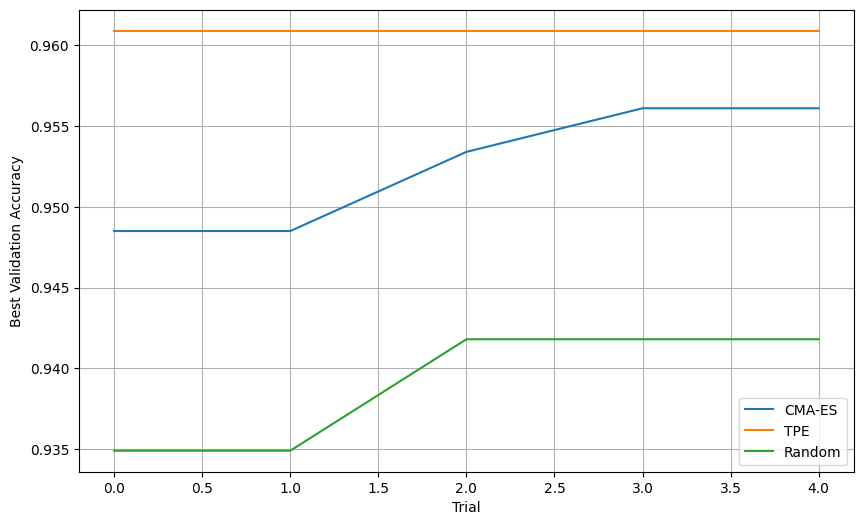

In [ ]:

def plot_optimization_history(studies, labels):
    plt.figure(figsize=(10, 6))
    
    for study, label in zip(studies, labels):
        trials_df = study.trials_dataframe()
        best_values = trials_df['value'].cummax()
        plt.plot(best_values, label=label)
    
    #plt.title('Optimization History: Best Validation Accuracy')
    plt.xlabel('Trial')
    plt.ylabel('Best Validation Accuracy')
    plt.legend()
    plt.grid(True)
    plt.savefig('hypertune.jpg',bbox_inches='tight', dpi=200)
    plt.show()

# Plotting the optimization history of each sampler
#plot_optimization_history([cmaes_study, tpe_study, grid_study], ['CMA-ES', 'TPE', 'Random'])